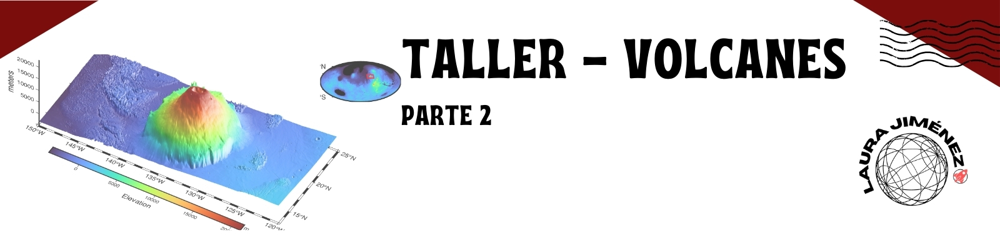

# **TALLER: VOLCANES EN EL SISTEMA SOLAR**
# 🚀 Hagamos mapas de Marte con pygmt 🌌

### Laura Daniela Jiménez P.

Esta taller cubre los fundamentos de la creación de mapas y un gráfico 3D de Marte (¡sí, Marte!). La idea es demostrar que se puede usar una secuencia simple de comandos con PyGMT, un contenedor de Python para las Herramientas de Mapeo Genérico (GMT), y con datos públicos sobre la topografía de Marte, crear mapas propios y comparar esta topografía con lo que conocemos de nuestro planeta, la Tierra.

## 🛠️

Puedes ejecutar este notebook con tu instalación local de PyGMT, a través de Binder o incluso de Google Colab. Consulta los comentarios de cada opción a continuación.

Versión PyGMT: 2024<br>

*Este cuaderno se basa en el tutorial original de Andre Belem disponible en su repositorio de GitHub:
[PlanetaryMaps - Tutorial Mars Maps V2](https://github.com/andrebelem/PlanetaryMaps/blob/main/2_%20Tutorial%20Mars%20Maps%20V2.ipynb).*

**Nota si estás usando COLAB<br>**

La versión de Python en COLAB es diferente a la que necesita la nueva versión de GMT para instalarse junto con Pygmt. Por lo tanto, una solución es reinstalar GMT usando Conda, junto con otros paquetes importantes. Esto se realiza con el siguiente bloque de comandos.

**Use esto SOLO si desea ejecutarlo en COLAB**<br>

In [ ]:
# Instalando conda. Tenga en cuenta que es necesario reiniciar el kernel para que los cambios se apliquen, lo cual ocurre automáticamente.
# No te preocupes por el mensaje "Su sesión se bloqueó por un motivo desconocido".
# ¡Puede ignorar este mensaje sin problema!
%%capture
!pip install -q condacolab
import condacolab
condacolab.install()

In [ ]:
%%capture
!pip install pygmt #<- nota: así se instala en colab, pero es diferente con conda o mamba.

In [ ]:
!conda activate pygmt-env        # activate virtual environment
!conda install -c conda-forge gmt  # to install the GMT C package
!pip install pygmt                     # install PyGMT


CondaError: Run 'conda init' before 'conda activate'

Channels:
 - conda-forge
Platform: linux-64
Solving environment: \ | / - done

## Package Plan ##

  environment location: /usr/local

  added / updated specs:
    - gmt


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    attr-2.5.2                 |       h39aace5_0          66 KB  conda-forge
    blosc-1.21.6               |       he440d0b_1          47 KB  conda-forge
    c-ares-1.34.6              |       hb03c661_0         203 KB  conda-forge
    ca-certificates-2025.11.12 |       hbd8a1cb_0         149 KB  conda-forge
    certifi-2025.11.12         |     pyhd8ed1ab_0         153 KB  conda-forge
    conda-25.11.1              |  py311h38be061_0         1.2 MB  conda-forge
    conda-libmamba-solver-25.11.0|     pyhd8ed1ab_0          55 KB  conda-forge
    cpp-expected-1.3.1         |       h171cf75_0          24 KB  conda-f

**Ahora, comenzamos con Python real...**

Además, si estás en Colab o probando desde tu Jupyter, necesitarás la Topografía de Marte (MOLA) ya en una copia Netcdf del archivo original, distribuido desde la Mars Climate Database, de la Agencia Espacial Europea bajo el contrato ESTEC 11369/95/NL/JG(SC), y el Centro Nacional de Estudios Espaciales.<br>

In [ ]:
# Mars Topography (MOLA) en formato Netcdf
# Andre Belem lo comparte desde su repositorio gdrive:
#!gdown 1fDzz8AxR1T58y0IGPhmbb1ZwrTLckp2G

# o usemos el mola.nc que comparte en github
!wget https://github.com/andrebelem/PlanetaryMaps/raw/main/mola32.nc

--2025-12-29 03:33:37--  https://github.com/andrebelem/PlanetaryMaps/raw/main/mola32.nc
Resolving github.com (github.com)... 140.82.114.3
Connecting to github.com (github.com)|140.82.114.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://media.githubusercontent.com/media/andrebelem/PlanetaryMaps/main/mola32.nc [following]
--2025-12-29 03:33:38--  https://media.githubusercontent.com/media/andrebelem/PlanetaryMaps/main/mola32.nc
Resolving media.githubusercontent.com (media.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to media.githubusercontent.com (media.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 132780052 (127M) [application/octet-stream]
Saving to: ‘mola32.nc’

mola32.nc           100%[===================>] 126.63M  55.8MB/s    in 2.3s    

2025-12-29 03:33:40 (55.8 MB/s) - ‘mola32.nc’ saved [132780052/132780052]



**PERO**, si clonaste el repositorio y estás en tu Jupyter local...

Simplemente omite el bloque anterior. Comprueba si tienes el archivo `mola32.nc` en tu carpeta. Hay una copia en [Github](https://github.com/andrebelem/PlanetaryMaps) si la necesitas. Puedes descargarla directamente desde allí.


## Datos de Marte

Primero, abrimos el archivo `mola32.nc` con xarray. Observe que las longitudes van de 0 a 360°, las latitudes se distribuyen de norte a sur y la variable `alt` representa la topografía MOLA a 32 píxeles/grado, generada a partir del archivo MOLA original.
`megt90n000fb.img`.

In [ ]:
import xarray as xr

dset_mars = xr.open_dataset('mola32.nc')
dset_mars

<xarray.Dataset> Size: 133MB
Dimensions:    (latitude: 5760, longitude: 11520)
Coordinates:
  * latitude   (latitude) float32 23kB 89.98 89.95 89.92 ... -89.95 -89.98
  * longitude  (longitude) float32 46kB 0.01562 0.04688 0.07812 ... 360.0 360.0
Data variables:
    alt        (latitude, longitude) int16 133MB ...
Attributes:
    title:    MOLA Topography - 32 pixels/degree
    history:  Built from original MOLA file megt90n000fb.img

Al igual que cualquier otro notebook con pygmt, importamos la biblioteca y manipulamos otros datos. Para crear un mapa de toda la superficie marciana sin consumir mucho tiempo ni memoria, reducimos la resolución usando `grdsample`. También aprovechamos la oportunidad para transformar la variable `alt` en un valor `float` para poder usarla en mapas.

In [ ]:
import pygmt
# convertir de int16 a float
dset_mars_topo = dset_mars.alt.astype(float)

# Un mapa global de Marte podría ser muy interesante. Solo necesitamos una resolución que no consuma toda la memoria.
# Aquí, los cambios de cuadrícula a registro de píxeles y el espaciado se establecen en una resolución de 1 grado.
dset_mars_topo = pygmt.grdsample(grid=dset_mars_topo,translate=True,spacing=[0.9375,0.9375])

# Tenga en cuenta la ADVERTENCIA: el delta_x/delta_y del conjunto de datos MOLA es de 0,03125 grados. Si desea corregirlo, simplemente use un múltiplo del espaciado.
# No se preocupe por las advertencias.

grdsample [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
grdsample [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
grdsample (gmtapi_init_grdheader): Please select compatible -R and -I values
grdsample [WARNING]: Output sampling interval in x exceeds input interval and may lead to aliasing.
grdsample [WARNING]: Output sampling interval in y exceeds input interval and may lead to aliasing.


Crearemos un mapa de toda la superficie marciana, en las mismas proyecciones que usamos para nuestro planeta.

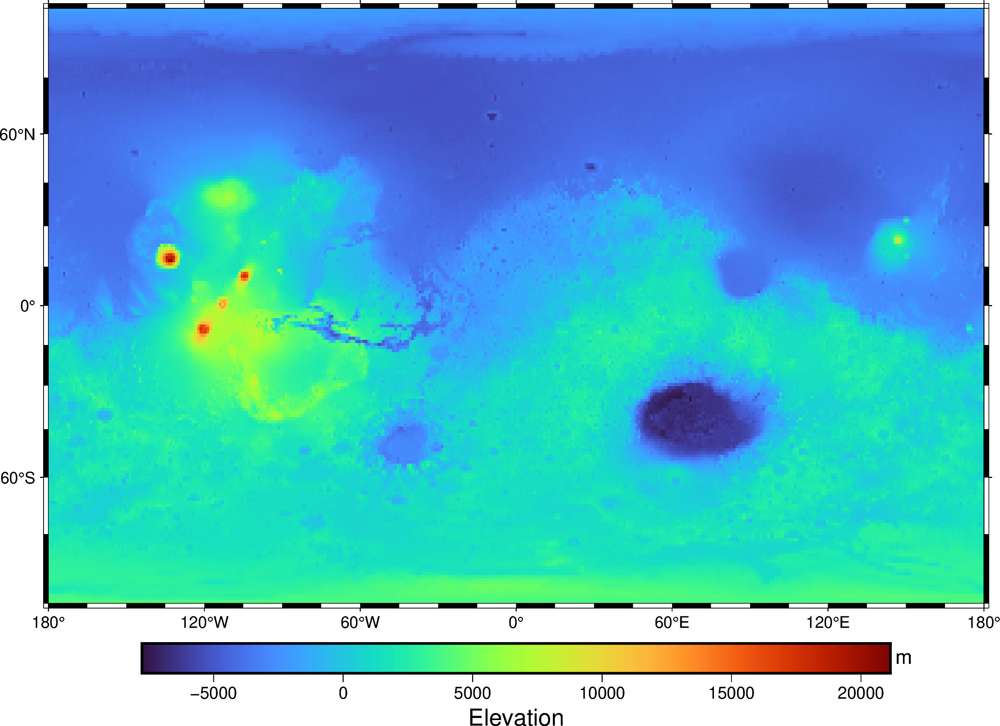

In [ ]:
fig = pygmt.Figure()

fig.grdimage(grid=dset_mars_topo,region='g',frame=True,projection='Cyl_stere/0/0/20c') #A226/18/40/12c
# Puedes probar con diferentes proyecciones.
# algunas ideas: Eckert IV = Kf; Hammer = H; Mollweide = W

fig.colorbar(frame=["a5000", "x+lElevation", "y+lm"])
fig.show()

Una característica muy interesante es el Monte Olympus (Olympus Mons - vea más detalles en https://mars.nasa.gov/resources/22587/olympus-mons), centrado aproximadamente en 19°N y 133°W, con una altura de 22 km y aproximadamente 700 km de diámetro. Usemos el conjunto de datos original con una resolución de 32 pixels/degree y tracemos un mapa (no tan interesante) con xarray.

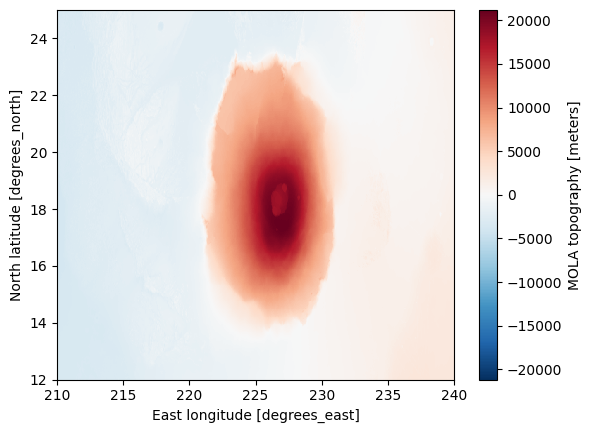

In [ ]:
# El Monte Olimpo se encuentra en estos segmentos de 12 grados de latitud y 30 grados de longitud.
# Nota: cortamos la región de interés y convertimos aquí los datos "alt" originales en int16 a float (para la cuadrícula).
dset_olympus = dset_mars.sel(latitude=slice(25,12),longitude=slice(210,240)).alt.astype('float')
dset_olympus.plot()

Usemos funciones de pygmt para crear un mapa.

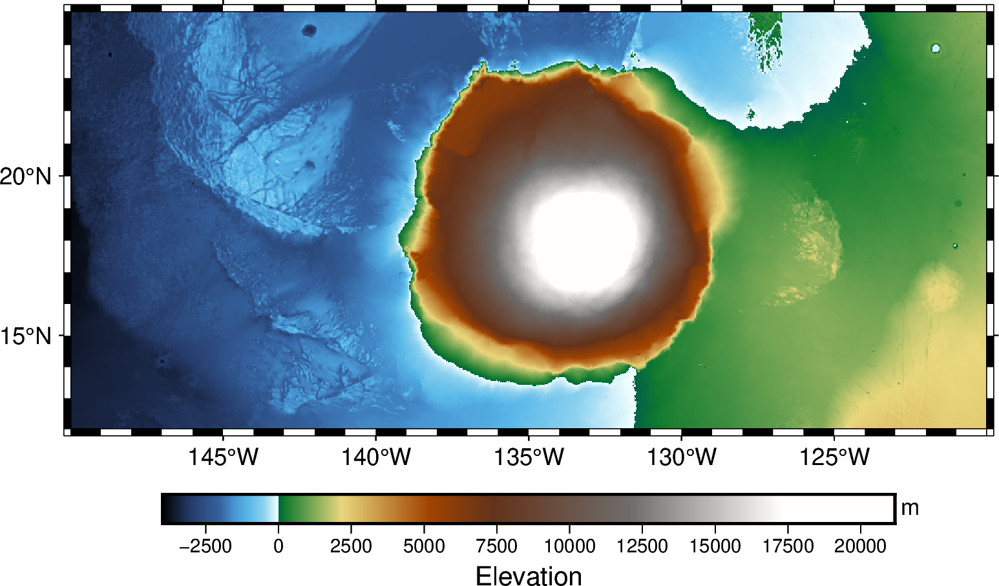

In [ ]:
# Primero lo primero
fig = pygmt.Figure()
# note que la función permite añadir la proyección, luego el cmap y después el marco.
fig.grdimage(grid=dset_olympus,projection='M12c',frame='a5f1',cmap='geo')
# Además, puedo agregar una barra de colores (después)
fig.colorbar(frame=["a2500", "x+lElevation", "y+lm"])

fig.show()

Añadiremos perspectiva y una escala de colores más interesante. Para facilitar la comprensión, separaremos la región de interés con el mismo recorte que creamos como base del conjunto de datos topográficos del Monte Olympus.

**Algunas notas**

`zsize` es un poco crítico aquí debido a que el volcán es muy grande (28 km si consideramos de -5000 a +23000 m). Asimismo, se eligió `perspective=[150.45]` de forma tentativa (es cuestión de gustos) y depende del flanco del volcán que se desee mostrar. Sin embargo, esta elección debe realizarse según el `shading`, ya que para dar una buena impresión 3D, la iluminación debe ajustarse según la elevación y el acimut de la perspectiva (se pueden usar diferentes valores de acimut, args y ambiente. Consulte la ayuda de [grdview](https://www.pygmt.org/latest/api/generated/pygmt.Figure.grdview.html)).

Finalmente, creemos un mapa combinado que muestre el planeta en un recuadro en la esquina superior derecha. Usamos las mismas coordenadas del cuadro delimitador que se usaron para recortar la topografía, dibujando en rojo en el mapa. Claramente, la escala de colores es la misma.

### Uso de `grdview` para visualización 3D

La función `grdview` de PyGMT es una potente herramienta para crear vistas en perspectiva 3D de datos en cuadrícula/grilla. Al ajustar los parámetros de acimut y elevación, puede cambiar el punto de vista, lo que le ayuda a resaltar características específicas del terreno o patrones de datos. Veamos cómo estos parámetros afectan la visualización.

**Configuración de la perspectiva: Acimut y elevación**

- **Acimut** (`azimut`): Controla la rotación horizontal de la vista, que va de 0° a 360°. Los valores más bajos (cercanos a 0°) representan una vista desde el norte, mientras que 90° proporciona una vista desde el este, 180° desde el sur, y así sucesivamente. Experimentar con el acimut puede ayudar a mostrar aspectos específicos de los datos desde diferentes ángulos.
- **Elevación** (`elevation`): Controla el ángulo vertical de la vista; 90° representa una perspectiva de arriba a abajo y los valores más bajos proporcionan una vista más lateral. Normalmente, los valores entre 20° y 60° crean un efecto 3D balanceado.

**Ejemplo**:
Usar `perspective=[150,45]` significa que `azimut=150` y `elevation=45` ofrecen una vista sureste, con una inclinación moderada para capturar detalles tanto horizontales como verticales.

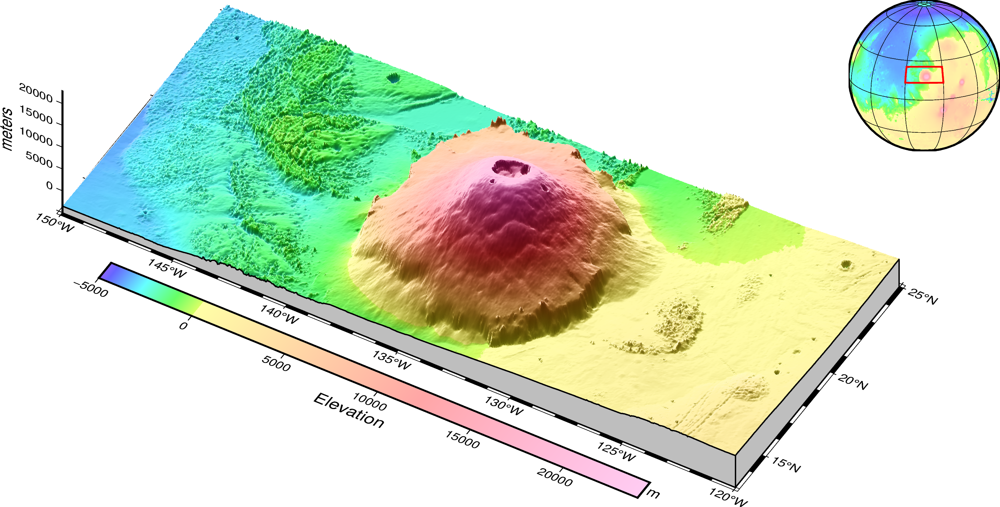

In [ ]:
fig = pygmt.Figure()
#note que añadí la proyección, luego el cmap y luego, el marco (y controlo el marco)
topo_cpt = pygmt.makecpt(cmap='sealand',series=f'-5000/24000/1000',continuous=True)
frame =  ["xa5f1","ya5f1", "z5000+lmeters", "wSEnZ"]

fig.grdview(grid=dset_olympus,
            region=[210,240,13,25,-5000,23000],
            frame=frame,
            perspective=[150,45],
            projection='M18c',
            zsize='4c',
            surftype='i', # Verifique que el tipo de superficie sea "i" (de imagen)
            cmap=topo_cpt,
            plane="-5000+ggrey",
            shading='+d', # Así usamos el sombreado predeterminado
            )

fig.colorbar(perspective=True, frame=["a5000", "x+lElevation", "y+lm"])

bounds = [[210.,13.],
          [210.,25.],
          [240.,25.],
          [240.,13.],
          [210.,13.]]

with fig.inset(position="JTR+w3.5c+o0.2c", margin=0, box=None):
    #Crea una figura en el recuadro utilizando la proyección global centrada en Olympus Mons:
    fig.grdimage(grid=dset_mars_topo,region='g',frame='g',projection='G225/19/3.5c')
    fig.plot(bounds,pen="1p,red")

fig.show()

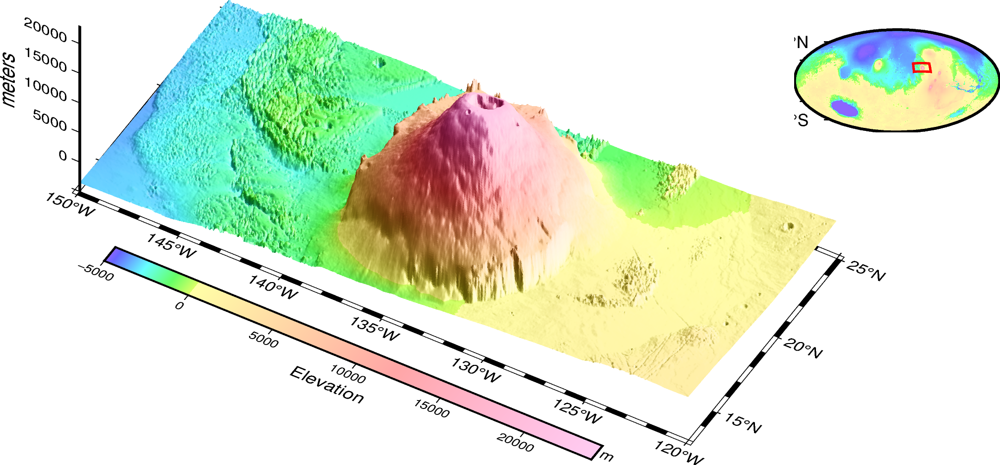

In [ ]:
fig = pygmt.Figure()

# Redefinir topo_cpt para garantizar que esté disponible correctamente para esta celda
topo_cpt = pygmt.makecpt(cmap='sealand',series=f'-5000/24000/1000',continuous=True)

fig.grdview(grid=dset_olympus,
           region=[210,240,13,25,-5000,23000],
           surftype='s',
           cmap=True,
           projection='M12c',
           perspective=[150,45],
           zsize='4c',
           frame=['xa5f1','ya5f1','z5000+lmeters','wSEnZ'],shading='+a50+nt1')

bounds = [[210,13],
         [210,25],
         [240,25],
         [240,13],
         [210,13]]

# Pasar explícitamente la región y la proyección a la barra de colores
fig.colorbar(perspective=True,frame=['a5000','x+lElevation','y+lm'])
with fig.inset(position='JTR+w3.5c+o0.2c',margin=0,box=None):
    fig.grdimage(grid=dset_mars_topo,region='g',frame=True,projection='W3.5c')
    fig.plot(bounds, pen='1p,red')

fig.show()

## Ahora, ¿qué tal Hawaii?

Cuando leemos sobre Olympus Mons, usualmente se compara con el Everest aquí en la Tierra. Sin embargo, lo más interesante es compararlo con otra cordillera tomando como referencia el lecho marino abisal (sin el océano) - Hawaii. Curiosamente, en términos de latitudes y longitudes en el planeta, estas dos características están en casi la misma posición. Para igualar las dimensiones aproximadas, recortemos una muestra del `Earth Global Relief` usando `pygmt.datasets` con segmentos de 12 grados de latitud y 30 grados de longitud.

In [ ]:
!pip install h5netcdf
!pip install scipy
!pip install store
!pip install io
!pip install xarray

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 9.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.9/35.9 MB 49.7 MB/s eta 0:00:00


ERROR: Could not find a version that satisfies the requirement io (from versions: none)
ERROR: No matching distribution found for io


In [ ]:
import h5netcdf
import scipy
import io
import xarray
import pygmt.datasets

El SRTM DEM (Shuttle Radar Topography Mission Digital Elevation Model) es un conjunto de datos global de elevación del terreno de alta calidad, creado por la NASA y la NGA a partir de datos de radar del Transbordador Espacial, que proporciona mapas topográficos detallados para diferentes tipos de estudios, con resoluciones de hasta 30 metros (1 segundo de arco) y disponible para descarga en plataformas como Earth Explorer y QGIS.

In [ ]:
# Obtenga SRTM en Hawái
topo_hawaii = pygmt.datasets.load_earth_relief(region=[-170,-140,13,25],resolution="05m")

#y ahora toda la Tierra con la misma resolución de nuestro conjunto de datos de Marte de baja resolución
topo_globe = pygmt.datasets.load_earth_relief(region=[-180,180,-90,90],resolution="01d")


grdblend [NOTICE]: Remote data courtesy of GMT data server oceania [http://oceania.generic-mapping-tools.org]
grdblend [NOTICE]: SRTM15 Earth Relief v2.7 at 05x05 arc minutes reduced by Gaussian Cartesian filtering (26.2 km fullwidth) [Tozer et al., 2019].
grdblend [NOTICE]:   -> Download 180x180 degree grid tile (earth_relief_05m_g): S90W180
gmtread [NOTICE]: Remote data courtesy of GMT data server oceania [http://oceania.generic-mapping-tools.org]
gmtread [NOTICE]: SRTM15 Earth Relief v2.7 at 1x1 arc degrees reduced by Gaussian Cartesian filtering (314.5 km fullwidth) [Tozer et al., 2019].
gmtread [NOTICE]:   -> Download grid file [112K]: earth_relief_01d_g.grd


A continuación usamos la misma secuencia de comandos que arriba para hacer un mapa.

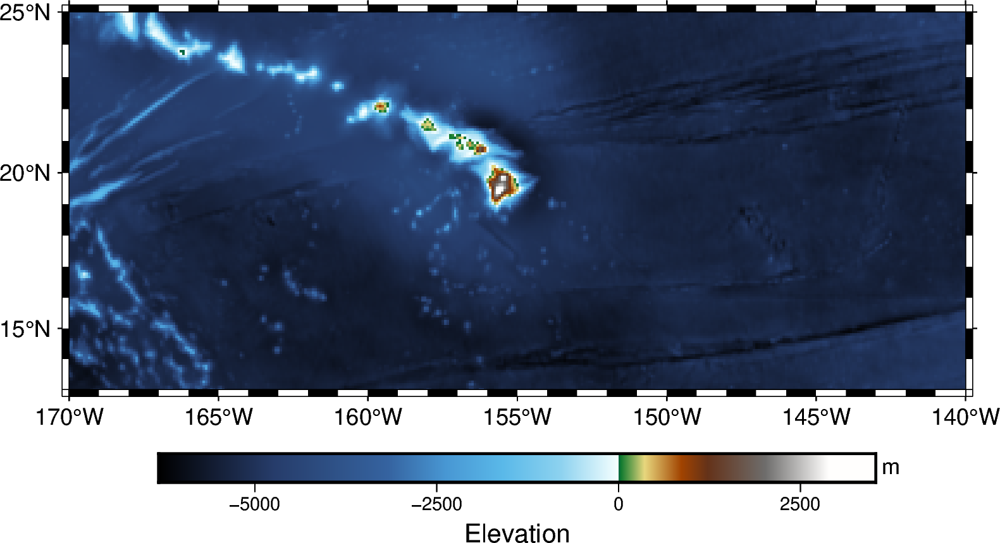

In [ ]:
fig = pygmt.Figure()
#mapa con proyección, marco y escala de color:
fig.grdimage(grid=topo_hawaii,projection='M12c',frame='a5f1',cmap='geo')
# barra de color:
fig.colorbar(frame=["a2500", "x+lElevation", "y+lm"])

fig.show()

**Otras notas**

Como queremos hacer una comparación, mantendremos la misma escala de colores que Marte, usando como base para el plano Z -5000 metros (ver la línea `plane="-5000+ggrey"`, exactamente igual que en el mapa de arriba). El recuadro en la esquina superior derecha es el mismo y ajustamos las coordenadas del cuadro delimitador utilizadas para recortar la topografía, dibujando en rojo en el mapa.

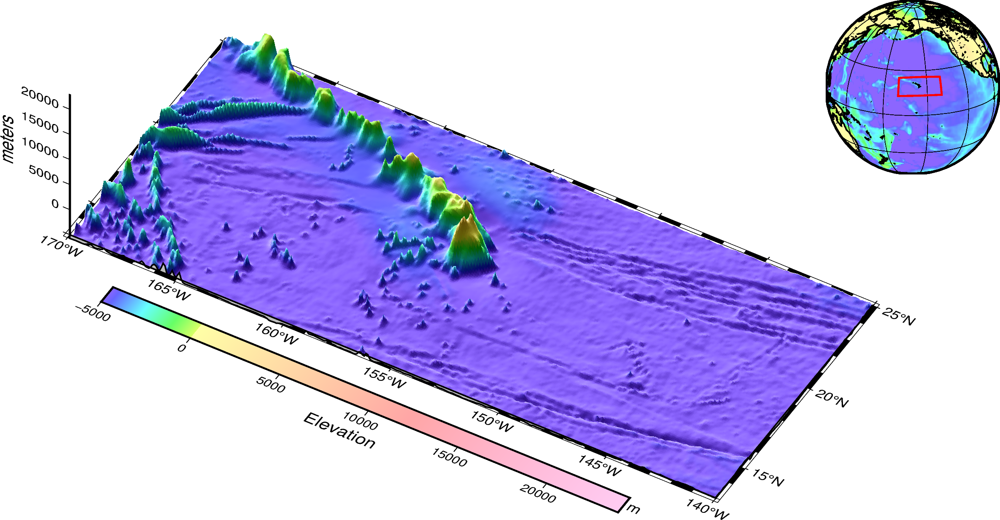

In [ ]:
fig = pygmt.Figure()

frame =  ["xa5f1","ya5f1", "z5000+lmeters", "wSEnZ"]

topo_cpt = pygmt.makecpt(cmap='sealand',series=f'-5000/24000/1000',continuous=True)

fig.grdview(grid=topo_hawaii,
            region=[-170,-140,13,25,-5000,23000],
            frame=frame,
            perspective=[150,45],
            projection='M15c',
            zsize='4c',
            surftype='i',
            cmap=topo_cpt,
            plane="-5000+ggrey",
            shading='+d'
           )

fig.colorbar(perspective=True, frame=["a5000", "x+lElevation", "y+lm"])

bounds = [[-170.,13.],
          [-170.,25.],
          [-140.,25.],
          [-140.,13.],
          [-170.,13.]]

with fig.inset(position="JTR+w3.5c+o0.2c", margin=0, box=None):
    # Crea una figura complementaria usando la proyección global centrada en Olympus Mons:
    fig.grdimage(grid=topo_globe,region='g',frame='g',projection='G-160/19/3.5c')
    fig.coast(region='g',shorelines="thin", frame="g")
    fig.plot(bounds,pen="1p,red")

fig.show()

## Combinando los dos mapas uno al lado del otro

Básicamente, son los mismos bloques que los anteriores, solo que se utiliza el mecanismo `Figure.set_panel` de `pygmt` para crear mosaicos.

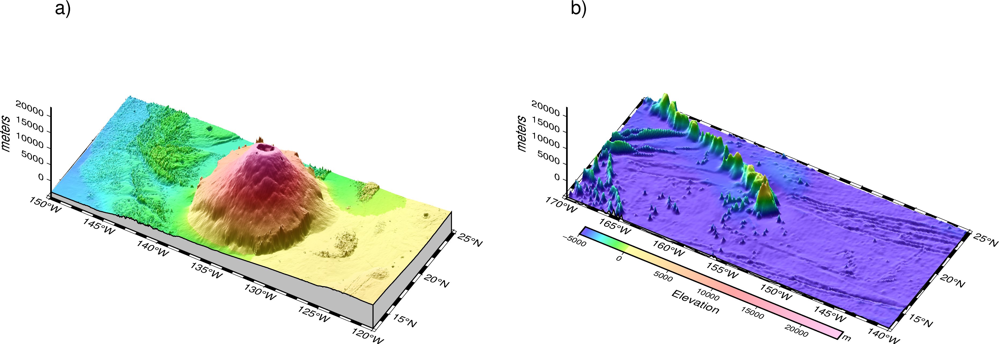

In [ ]:
fig = pygmt.Figure()

with fig.subplot(
    nrows=1, ncols=2, figsize=("28c", "16c"), autolabel=True, margins="2c"
):
    with fig.set_panel(panel=0):

        topo_cpt = pygmt.makecpt(cmap='sealand',series=f'-5000/24000/1000',continuous=True)

        frame =  ["xa5f1","ya5f1", "z5000+lmeters", "wSEnZ"]

        fig.grdview(grid=dset_olympus,
                    region=[210,240,13,25,-5000,23000],
                    frame=frame,
                    perspective=[150,45],
                    projection='M',
                    zsize='4c',
                    surftype='i',
                    cmap=topo_cpt,
                    plane="-5000+ggrey",
                    shading='+d',
                    # Establezca el grosor del contorno en "0,1p"
                    contourpen="0.1p",)

        # No necesitamos la escala de colores en ambas figuras
        #fig.colorbar(perspective=True, frame=["a5000", "x+lElevation", "y+lm"])

    with fig.set_panel(panel=1):
        frame =  ["xa5f1","ya5f1", "z5000+lmeters", "wSEnZ"]

        topo_cpt = pygmt.makecpt(cmap='sealand',series=f'-5000/24000/1000',continuous=True)

        fig.grdview(grid=topo_hawaii,
                    region=[-170,-140,13,25,-5000,23000],
                    frame=frame,
                    perspective=[150,45],
                    projection='M',
                    zsize='4c',
                    surftype='i',
                    cmap=topo_cpt,
                    plane="-5000+ggrey",
                    shading='+d',
                    # Establezca el grosor del contorno en "0,1p"
                    contourpen="0.1p",)

        fig.colorbar(perspective=True, frame=["a5000", "x+lElevation", "y+lm"])

fig.show()

Dependiendo de la configuración de tu monitor y de Chrome, estos mapas pueden aparecer pequeños, pero no lo son. Ten en cuenta que figsize=("28c", "16c") son dimensiones razonables para una figura de calidad. Descárgalo como PNG y compruébalo tú mismo.

In [ ]:
fig.savefig("Marte+Hawai.png")

## Bonus map

Mapa adicional

Recientemente, el rover Zhurong de la misión Tianwen-1 aterrizó con éxito a 109.926°E, 25.066°N, en el sur de *Utopia Planitia* en Marte (consulta el artículo de Ye, B., Qian, Y., Xiao, L., Michalski, J. R., Li, Y., Wu, B. y Qiao, L. (2021).Objetivos de exploración geomorfológica en el sitio de aterrizaje de Zhurong en el sur de Utopia Planitia de Marte. Earth and Planetary Science Letters, 576, 117199. https://doi.org/10.1016/j.epsl.2021.117199). Podemos crear un mapa de la región con el punto de aterrizaje.

Primero, localicemos Utopia Planitia. Observa la Figura 1 de Ye et al. (2021).

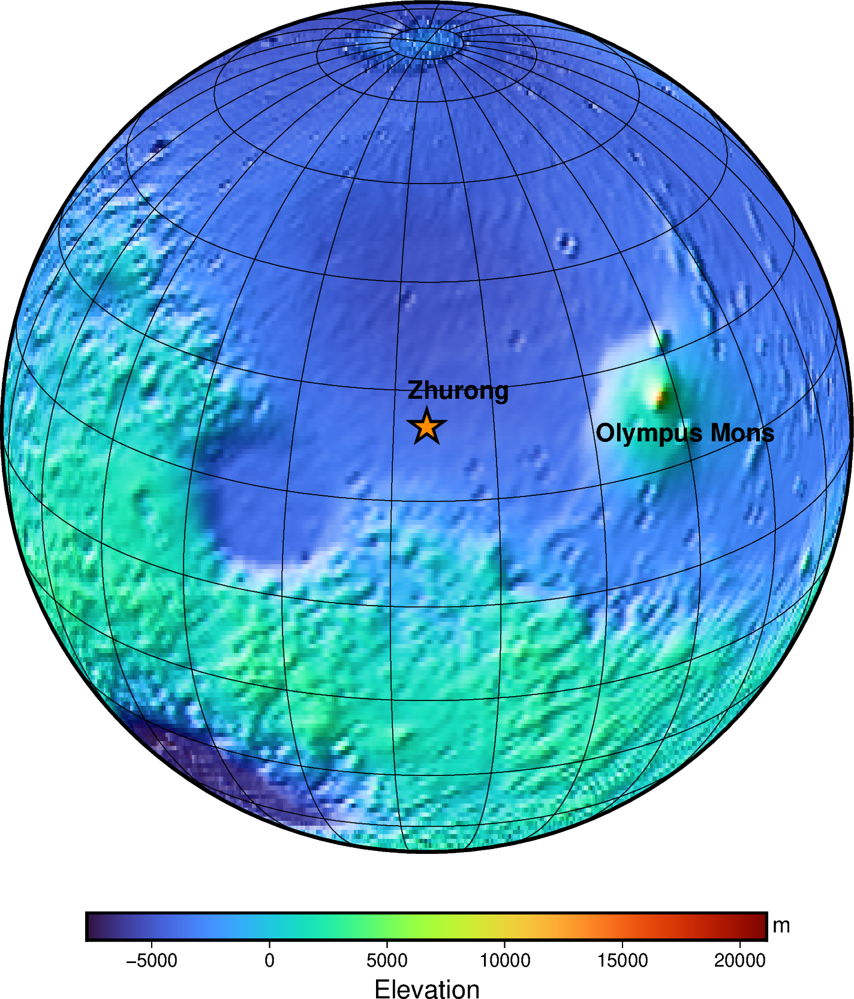

In [ ]:
fig = pygmt.Figure()

# Usaremos una vista ortográfica centrada en el lugar de aterrizaje.
fig.grdimage(grid=dset_mars_topo,region='g',frame='g',projection='G109.926/25.066/12c',shading='+d')

zhurong = [109.926,25.066]
Olympus = [360-210,19.0] #Posición del Monte Olimpo: ver el borde izquierdo del área

# Pondremos una "estrella" en el lugar de aterrizaje y etiquetamos con un pequeño desplazamiento de texto
fig.plot(x=zhurong[0],y=zhurong[1],style="a0.5c", pen="1p,black", fill="darkorange") #Tenga en cuenta que en la versión anterior de pygmt, el parámetro era "color".
fig.text(x=zhurong[0]+5,y=zhurong[1]+5, text="Zhurong", font='10p,Helvetica-Bold')

fig.text(x=Olympus[0],y=Olympus[1], text="Olympus Mons", font='10p,Helvetica-Bold')

fig.colorbar(frame=["a5000", "x+lElevation", "y+lm"])
fig.show()

## Valles Marineris

Otra formación geológica muy interesante de Marte son los **Valles Marineris** (que significa *Valles de Mariner* en latín, en referencia al orbitador marciano Mariner 9, que voló entre 1971 y 1972). Se trata de un sistema geológico superficial marciano que se extiende desde el este de la región de Tharsis a lo largo del Ecuador y mide más de 3000 km de largo, 600 km de ancho en algunos tramos y unos impresionantes 8 km de profundidad. Erróneamente, algunos intentan comparar el sistema de cañones de los *Valles Marineris* con el Gran Cañón de la Tierra, y demostraremos que esta comparación es prácticamente imposible.

Primero, separemos la región donde se encuentra este sistema, que se extiende aproximadamente entre 110°O y 15°O (250°-345° en el sistema de coordenadas del mapa, que va de 0 a 360°).

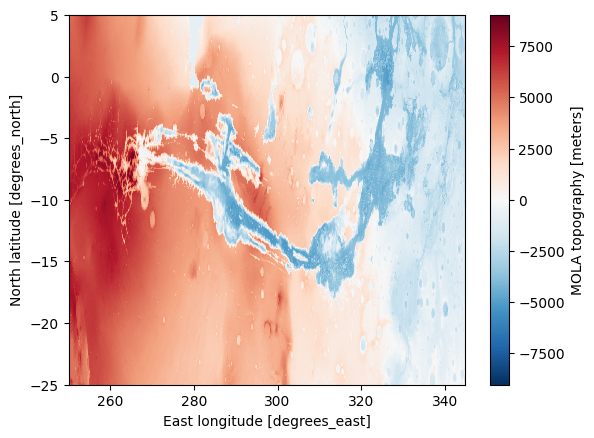

In [ ]:
# Valles Marineris
marineris = [360-110,360-15,-25,5]

dset_marineris = dset_mars.sel(latitude=slice(marineris[3],marineris[2]),longitude=slice(marineris[0],marineris[1])).alt.astype('float')
dset_marineris.plot()

Tenga en cuenta que el sistema de cañones se extiende desde una región muy alta (aprox. 8000 m) hasta una zona más baja (aprox. -8000 m). Utilizaremos 'PyGMT' para extraer una franja proporcional de la superficie terrestre, geográficamente de dimensiones similares, que contenga el área geográfica del Gran Cañón. Sin embargo, controle sus expectativas. Verá que es imposible comparar el tamaño de ambos sistemas.

In [ ]:
# Obtenga SRTM alrededor del Gran Cañón
grandcanyon = [360-120,360-25,15,45]
topo_grandcanyon = pygmt.datasets.load_earth_relief(region=grandcanyon,resolution="05m")

Ahora usando 'PyGMT'. Tenga en cuenta que usaremos las mismas proyecciones, solo que desplazaremos el mapa de la superficie terrestre hacia un lado para permitir una comparación de escala. La flecha señala la ubicación del Gran Cañón.<br>
Tenga en cuenta que, justo después de trazar cada mapa, usamos la función 'text' para escribir los textos "Marte" y "Tierra", además de "Gran Cañón". La región y la proyección de este comando son planas, lo que permite una buena flexibilidad para colocar cualquier texto en el mapa. Puede agregar 'frame="a"' al comando 'fig.text' para ver dónde está el borde de este marco. Esto le ayudará a colocar el texto de la forma más conveniente.

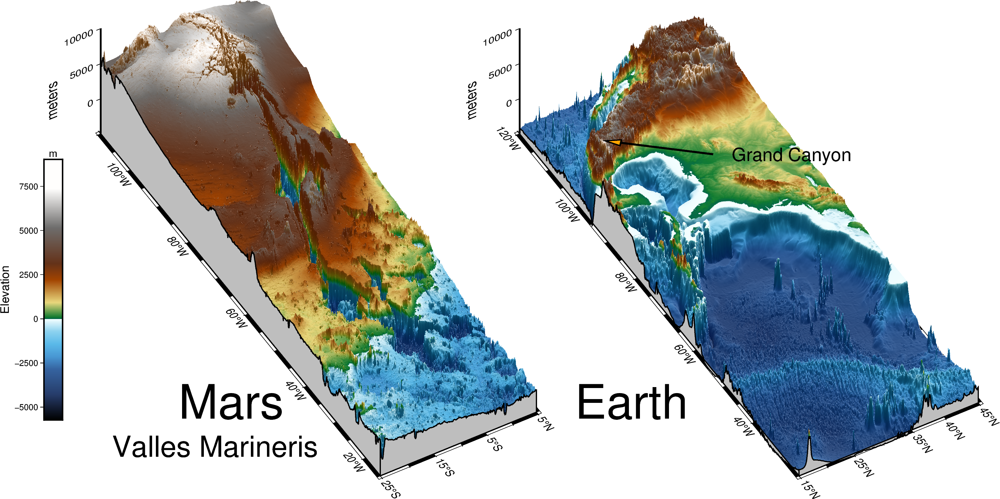

In [ ]:
fig = pygmt.Figure()

with fig.subplot(nrows=1, ncols=2, figsize=("20c", "8c"), autolabel=False, margins="1c"):

    with fig.set_panel(panel=0):

        frame =  ["xa20f5","ya5f5", "z5000+lmeters", "wSEnZ"]

        # Primer mapa
        fig.grdview(grid=dset_marineris,
                    region=marineris+[-5000,10000],
                    frame=frame,
                    perspective=[120,45],
                    projection='M15c',
                    zsize='4c',
                    surftype='i',
                    cmap='geo',
                    plane="-5000+ggrey",
                    shading='+d')

        fig.colorbar(frame=["a2500", "x+lElevation", "y+lm"],
                     position="JML+o2c/1c+w7c/0.5c",)
        # texto (tenga en cuenta que la proyección es un cuadrado simple sobre el mapa)
        fig.text(x=0.35,y=0.2,text='Mars',font='36p,Helvetica,black',
                 region=[0,1,0,1],
                 projection='X10c',
                #frame='a'
                )
        fig.text(x=0.35,y=0.10,text='Valles Marineris',font='22p,Helvetica,black')

    with fig.set_panel(panel=1):
        # segundo mapa
        fig.grdview(grid=topo_grandcanyon,
                    region=grandcanyon+[-5000,10000],
                    frame=frame,
                    perspective=[120,45],
                    projection='M15c',
                    zsize='4c',
                    surftype='i',
                    cmap='geo',
                    plane="-5000+ggrey",
                    shading='+d')
        # Flecha qie indica la ubicación del Gran Cañón
        fig.plot3d(perspective=True,x=-112.1,y=36.1,z=0,style="v0.5c+b+gorange+h0+p1p,black",pen='2p',direction=[[50],[3]])

        # texto (tenga en cuenta que la proyección es un cuadrado simple sobre el mapa)
        fig.text(x=0.3,y=0.2,text='Earth',font='36p,Helvetica,black',
                 region=[0,1,0,1.5],
                 projection='X10c/15c',
                #frame='a'
                )
        fig.text(x=0.65,y=1.62,text='Grand Canyon',justify='LM',font='14p,Helvetica,black',no_clip=True)

fig.show()

In [ ]:
fig.savefig("VallesMarineris.png")

## Jezero Crater

Uno de los sitios más populares de Marte es el cráter Jezero, ya que el [NASA's Perseverance rover](https://mars.nasa.gov/mars2020/mission/science/landing-site/) está explorando las inmediaciones del cráter, que se creía inundado. Los datos indican que este cráter contiene un depósito de abanico fluvial rico en arcilla. <br>

Aquí vamos a crear un mapa de los alrededores del cráter con 'PyGMT', un buen ejercicio que combina elementos básicos de cartografía con anotaciones de texto. Tenga en cuenta que para llegar a la versión final, es necesario probar, trazar, modificar y volver a probar hasta que el texto dentro de la figura, sus tamaños y colores, queden exactamente donde desea.<br>

Si desea explorar la ubicación del Perseverance, puede consultar https://mars.nasa.gov/mars2020/mission/where-is-the-rover/.

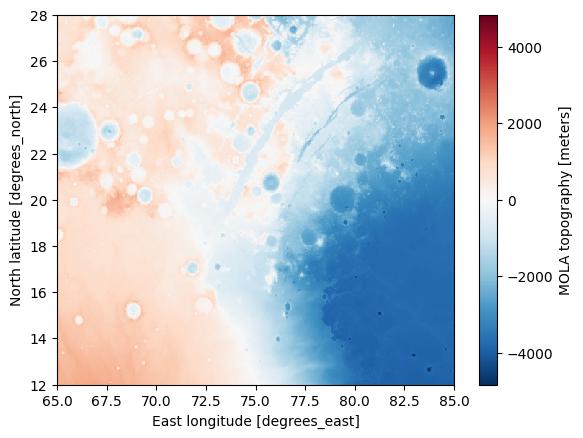

In [ ]:
# Jezero
jezero = [65,85,12,28]

dset_jezero = dset_mars.sel(latitude=slice(jezero[3],jezero[2]),longitude=slice(jezero[0],jezero[1])).alt.astype('float')
dset_jezero.plot()

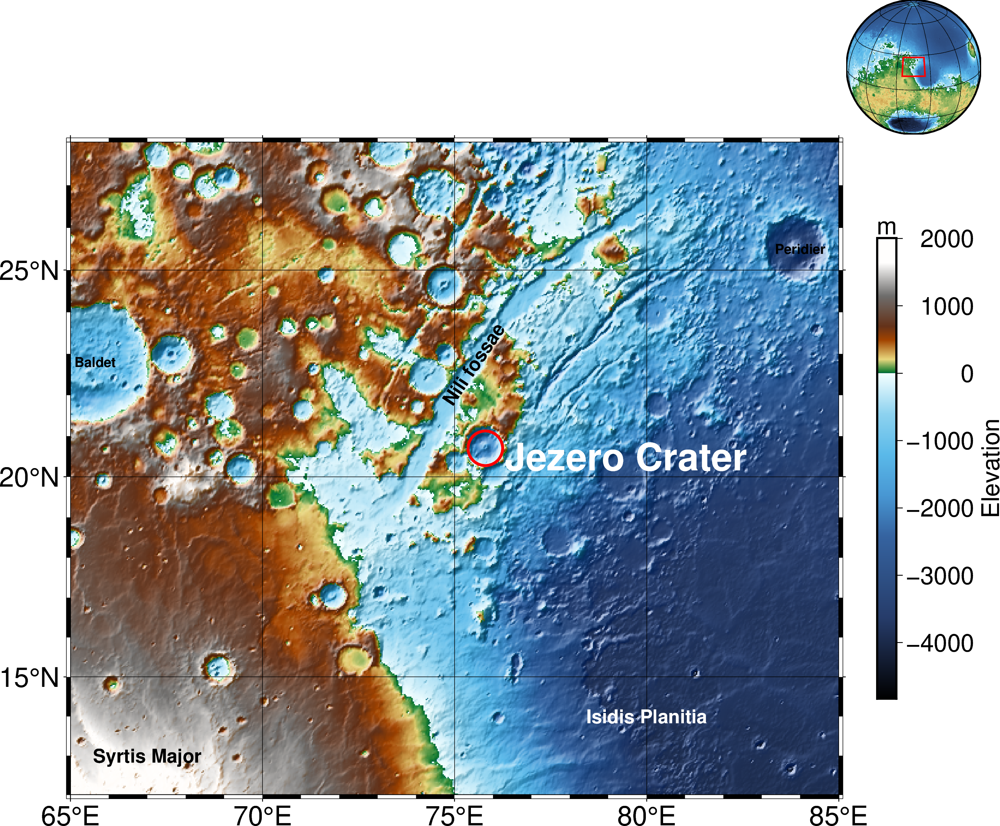

In [ ]:
fig = pygmt.Figure()

frame =  ["a5f1g5","WSen"]

with pygmt.config(FONT='20p'): # Jugar un poco con el tamaño de la fuente
    # A continuación se crea el mapa
    fig.grdimage(grid=dset_jezero,
                region=jezero,
                frame=frame,
                projection='M20c',
                cmap='geo',
                shading='+d'
                )

    fig.colorbar(frame=["a1000", "x+lElevation", "y+lm"],
                 position="JMR+o1c/0c+w12c/0.5c",)

#  y pongamos un pequeño mapa de Marte para mostrar la posición.
with fig.inset(position="JTR+w3.5c+o0.2c", margin=0, box=None):
    # Crea una figura complementaria en el recuadro utilizando la proyección global centrada en Jezero
    fig.grdimage(grid=dset_mars_topo,cmap='geo',region='g',frame='g',projection='G75/20/3.5c')

    bounds = [[jezero[0],jezero[2]],
          [jezero[0],jezero[3]],
          [jezero[1],jezero[3]],
          [jezero[1],jezero[2]],
          [jezero[0],jezero[2]]]

    fig.plot(bounds,pen="1p,red")

# Ahora vamos a escribir algo de texto relacionado con las características de la superficie.
features = [[76.3,20.5,0,'Jezero Crater','28p,Helvetica-Bold,white','LM'],
            [80,14,0,'Isidis Planitia','14p,Helvetica-Bold,white','CM'],
            [67,13,0,'Syrtis Major','14p,Helvetica-Bold,black','CM'],
            [74.8,21.8,56,'Nili fossae','14p,Helvetica-Bold,black','LM'],
            [84,25.5,0,'Peridier','10p,Helvetica-Bold,black','CM'],
            [65.1,22.8,0,'Baldet','10p,Helvetica-Bold,black','LM'],]

for feature in features:
    fig.text(x=feature[0],y=feature[1],
             angle=feature[2],
             text=feature[3],
             font=feature[4],
             justify=feature[5])

# Crea un círculo en el cráter Jezero
fig.plot(x=75.8,y=20.7,style='c0.9c',pen='2p,red')


fig.show()

In [ ]:
fig.savefig("JezeroCrater.png")

## Mapas adicionales

1. Puedes usar la misma estrategia que en los mapas anteriores para crear un mapa 3D de la zona de aterrizaje y exploración de Zhurong o del cráter Jezero.
2. Ten en cuenta que, en este caso, debes usar el conjunto de datos MOLA con la resolución más alta.
3. Prueba diferentes paletas de colores para ver el resultado y no olvides ajustar la perspectiva y el sombreado según corresponda.

Espero que lo hayas disfrutado.<br>